---

## 🔵 1. **What is Image Segmentation?**


### 📌 Definition:

**Image Segmentation** is the process of dividing an image into **meaningful regions** or **segments** to simplify analysis. In the context of machine learning and computer vision, the goal is often to assign a **label or class to each pixel** in an image.

This is called **semantic segmentation**.

---

### 🧠 Intuition:

Think of it like a coloring book:
Each region of the image gets a different color or label depending on what it represents (e.g. car, road, sky).

---

### 🧩 Formal Description:

Given an input image represented as a pixel array:

$$
\mathbf{x} \in \mathbb{R}^{H \times W \times C}
$$

where:

* $H$: height
* $W$: width
* $C$: number of channels (e.g. 3 for RGB)

The output is:

$$
\hat{f}(\mathbf{x}) \in \mathbb{R}^{H \times W}
$$

where each element $\hat{f}_{nm}$ represents the **class label** assigned to pixel $(n, m)$.

---

### 🧪 Example:

| Pixel     | Label |
| --------- | ----- |
| (45, 66)  | Sky   |
| (52, 67)  | Tree  |
| (120, 20) | Road  |

---

### 🎯 Goal:

To answer the question:

> "Is object class **c** present in pixel $[n, m]$?"

In other words:

* We want to **classify every single pixel**.
* Output is an image-sized label map.

---

### 💡 Types of Segmentation:

| Type                      | Description                                                                           |
| ------------------------- | ------------------------------------------------------------------------------------- |
| **Semantic Segmentation** | Classifies each pixel (e.g. all "dogs" are the same class)                            |
| **Instance Segmentation** | Classifies each pixel and distinguishes between different instances of the same class |
| **Panoptic Segmentation** | Combines semantic + instance (every pixel gets a class and an instance ID)            |

---

### 📷 Visual Example (Semantic Segmentation):

Original Image:

```
🐶🏠🌳🌤️

Segmented Output:

dog dog house tree sky
```

---


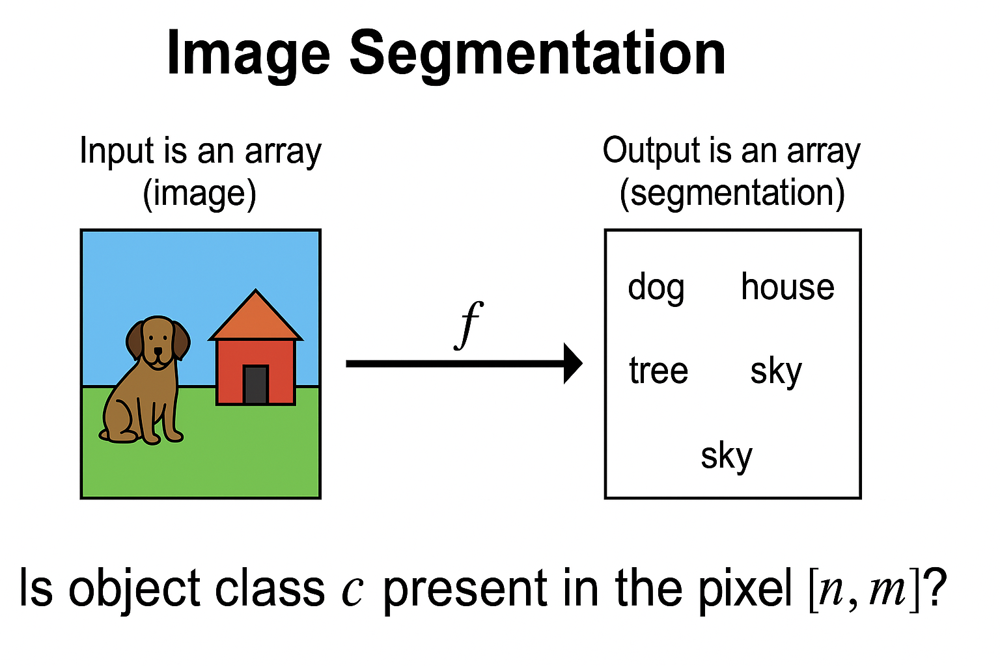

---

## 🔵 2. Goals and Applications

---

### 🎯 **Goals of Image Segmentation**

The **primary goal** is to simplify or change the representation of an image into something **more meaningful and easier to analyze**. Specifically:

#### ✅ Key Goals:

| Goal                         | Description                                                                                         |
| ---------------------------- | --------------------------------------------------------------------------------------------------- |
| **Object Identification**    | Identify which pixels belong to which object or region                                              |
| **Boundary Detection**       | Find precise borders between different structures (e.g., organs, roads)                             |
| **Region Labeling**          | Assign semantic meaning to areas (e.g., "sky", "tree", "tumor")                                     |
| **Dimensionality Reduction** | Convert high-resolution images into simpler abstract representations for analysis                   |
| **Feature Extraction**       | Help downstream tasks like classification, tracking, and detection by providing pre-processed input |

---

### 🧠 **Why Segment an Image?**

Image segmentation is crucial when you want **pixel-level understanding** of the image content, rather than just detecting that something is there.

Example scenarios:

* Self-driving cars don’t just detect “a pedestrian”; they need to **know exactly where** that person is to avoid collision.
* A medical AI system should **locate the tumor** precisely, not just say "tumor present."

---

### 🌍 **Applications of Image Segmentation**

#### 🏥 **1. Medical Imaging**

* **Goal**: Identify tumors, organs, blood vessels, etc.
* **Examples**:

  * Segmenting brain tumors in MRI scans
  * Locating retinal blood vessels in eye scans
  * Lung segmentation in CT scans

#### 🛰️ **2. Satellite and Aerial Imaging**

* **Goal**: Classify terrain types or objects from above
* **Examples**:

  * Detecting buildings, roads, vegetation, water bodies
  * Mapping agricultural land use

#### 🕵️ **3. Surveillance and Security**

* **Goal**: Detect and track people, objects, or movements
* **Examples**:

  * Identifying unauthorized individuals
  * Detecting abandoned objects in public places

#### 📹 **4. Video Summarization**

* **Goal**: Reduce video to its key components
* **Examples**:

  * Segmenting and tracking objects through time
  * Extracting action-relevant segments for review

#### 🚗 **5. Autonomous Vehicles**

* **Goal**: Understand the driving environment
* **Examples**:

  * Segmenting lanes, pedestrians, traffic signs
  * Classifying road vs. non-road areas

#### 🤖 **6. Robotics**

* **Goal**: Enable interaction with the environment
* **Examples**:

  * Object manipulation
  * Scene understanding for navigation

#### 🛍️ **7. Augmented Reality (AR) / Virtual Try-On**

* **Goal**: Identify body parts, clothing, or objects
* **Examples**:

  * AR filters that stick to face shape
  * Trying on clothes or glasses virtually

---

### 🧾 Summary Table

| Domain       | Segmentation Use                    | Importance                            |
| ------------ | ----------------------------------- | ------------------------------------- |
| Medical      | Tumors, organs, vessels             | High precision for diagnosis          |
| Satellite    | Land use, urban planning            | Wide-area analysis                    |
| Surveillance | Intrusion detection                 | Real-time threat recognition          |
| Video        | Object tracking                     | Video compression, event detection    |
| Automotive   | Lane, road, pedestrian segmentation | Crucial for autonomous driving safety |
| AR/VR        | Face/body segmentation              | Interactive and immersive experiences |

---



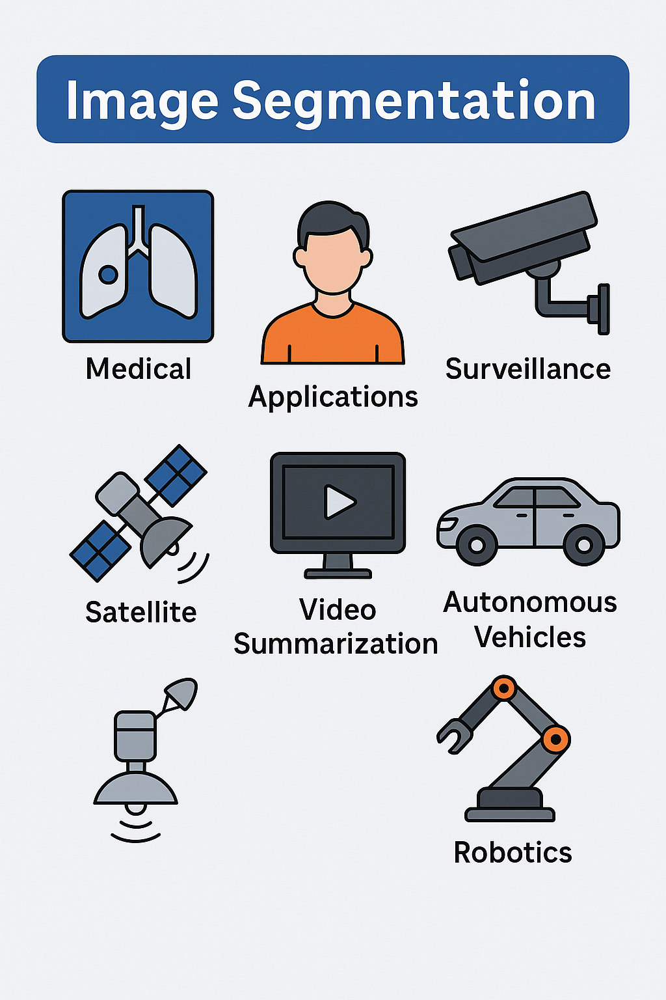

---

## 🔵 3. Segmentation Methods Overview

Segmentation methods can be broadly classified into:

### I. **Traditional (Classical) Methods**

These do **not require learning** from data and are based on **pixel values, statistics, and image properties**.

| Method Type           | Example Methods                            |
| --------------------- | ------------------------------------------ |
| Threshold-based       | Global Thresholding, Adaptive Thresholding |
| Clustering-based      | K-means, Mean-Shift                        |
| Edge-based            | Canny, Sobel + contour detection           |
| Region-based          | Region growing, Region merging             |
| Morphological methods | Watershed                                  |

---

### II. **Modern (Deep Learning) Methods**

These are **data-driven approaches** where a model learns from annotated training images.

| Method Type                             | Description                                                                |
| --------------------------------------- | -------------------------------------------------------------------------- |
| **Fully Convolutional Networks (FCNs)** | Replace dense layers with convolutional ones to retain spatial info        |
| **Encoder-Decoder Architectures**       | E.g. U-Net, SegNet — reduce and restore resolution while learning features |
| **Transformer-based Models**            | Use self-attention to capture global context (e.g., Segmenter, TransUNet)  |

---

Let’s now break down the **core traditional methods** in this PDF in detail:

---

## 🔶 A. **Thresholding**

**Goal**: Separate objects from background using pixel intensity.

### ✔ Global Thresholding:

* Choose a threshold $T$
* Pixel rule:

  $$
  \text{if } f(x,y) > T \rightarrow \text{object}, \quad \text{else} \rightarrow \text{background}
  $$

> Used when there's **high contrast** between foreground and background.

### ✔ Adaptive Thresholding:

* Threshold $T(x, y)$ is calculated **locally** for each pixel based on its **neighborhood**.
* Useful in **non-uniform lighting**.

---

## 🔶 B. **Region-Oriented Segmentation**

### ✔ Region Growing:

* Starts with **seed points**
* Grows regions by appending **neighboring pixels** with similar properties (intensity, texture)

> Easy to implement but **sensitive to noise and seed selection**.

---

## 🔶 C. **Watershed Segmentation** (explored in next section)

We'll cover this separately in detail in the next step, since it's a **major topic** in your PDF.

---

### Summary Table

| Method                | Strengths                 | Weaknesses                         |
| --------------------- | ------------------------- | ---------------------------------- |
| Thresholding          | Fast, simple              | Fails with noise, lighting changes |
| Adaptive Thresholding | Handles non-uniform light | May over-segment in noisy images   |
| Region Growing        | Intuitive, shape-aware    | Sensitive to noise/initialization  |
| Watershed             | Accurate boundaries       | Prone to over-segmentation         |
| K-means Clustering    | Unsupervised, simple      | May not respect spatial structure  |

---

### 🔍 When to Use What?

| Scenario                              | Best Method            |
| ------------------------------------- | ---------------------- |
| High contrast, binary foreground      | Global Thresholding    |
| Uneven lighting                       | Adaptive Thresholding  |
| Need for continuous region detection  | Region Growing         |
| Precise boundary detection needed     | Watershed Segmentation |
| General clustering of color/intensity | K-means Clustering     |

---


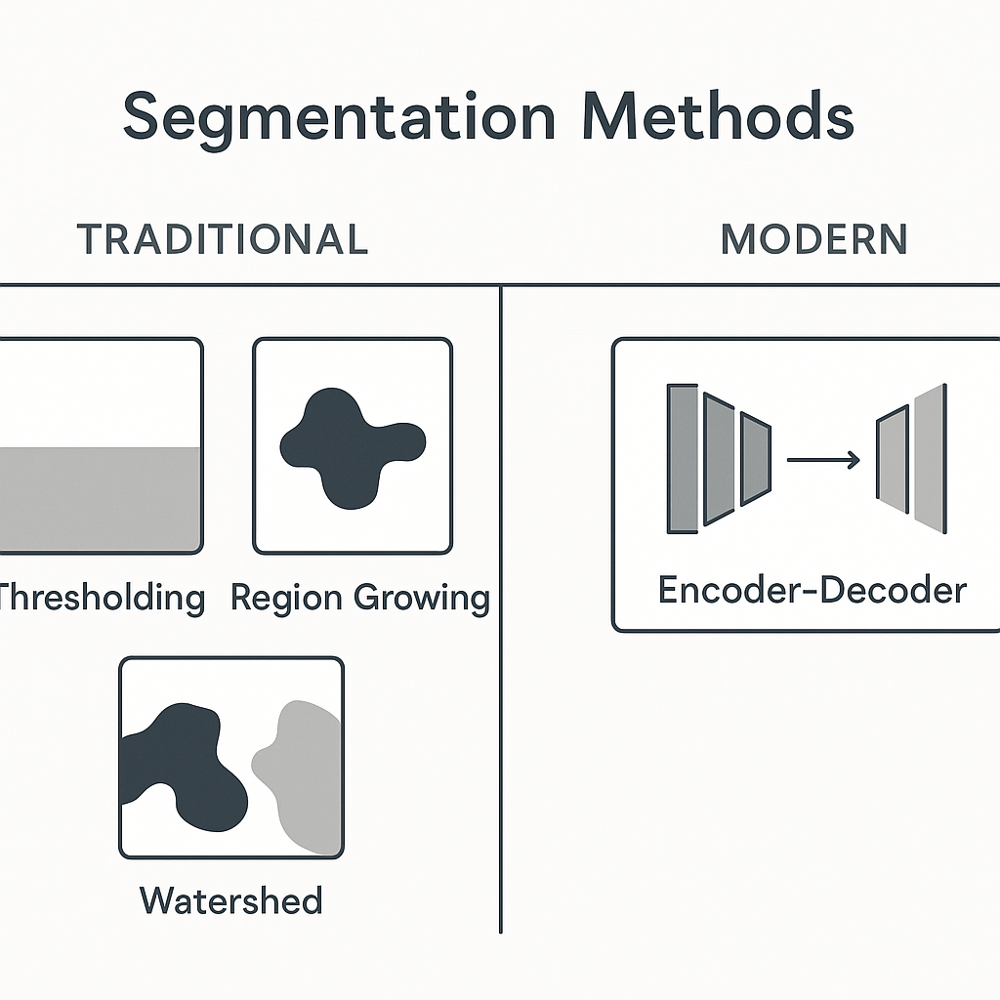


---

## 🔵 4. Thresholding

---

### 🧠 **Core Idea:**

Use a **threshold value** $T$ to classify each pixel as either **foreground (object)** or **background** based on its **intensity value**.

---

### 🧪 Basic Binary Thresholding (Global)

Given a grayscale image $f(x, y)$, we apply the rule:

$$
g(x, y) =
\begin{cases}
1 & \text{if } f(x, y) > T \quad (\text{foreground}) \\
0 & \text{otherwise} \quad (\text{background})
\end{cases}
$$

* Works well for **bimodal histograms** (where pixel intensities form two distinct peaks: one for background, one for object).
* Example use: black text on a white background.

---

### 📊 **Histogram-Based Thresholding**

* Compute the histogram of pixel intensities.
* Choose a threshold $T$ that **separates peaks** (object vs. background).
* This can be done manually or using algorithms like **Otsu’s method** (automatic selection).

---

### 🌍 Use Case Examples:

| Scenario                          | T value usage |
| --------------------------------- | ------------- |
| Dark objects on bright background | High T        |
| Bright objects on dark background | Low T         |
| Document binarization (OCR)       | Mid-range T   |

---

## 🔶 Adaptive Thresholding

### ✔ When Global Threshold Fails:

* In images with **uneven lighting**, a global $T$ won’t work.

### ✔ Solution:

Calculate **local thresholds** $T(x, y)$ for each pixel using its **neighborhood** (e.g. 3×3 or 5×5 window).

$$
g(x, y) =
\begin{cases}
1 & \text{if } f(x, y) > T(x, y) \\
0 & \text{otherwise}
\end{cases}
$$

Methods:

* **Mean Thresholding**: Local mean
* **Gaussian Thresholding**: Weighted local mean

---

### 🔬 Pros and Cons

| Feature    | Global Thresholding           | Adaptive Thresholding      |
| ---------- | ----------------------------- | -------------------------- |
| Speed      | Very fast                     | Slower                     |
| Accuracy   | Fails with lighting variation | Handles lighting variation |
| Complexity | Simple                        | Requires tuning            |

---

### 📷 Visual Intuition:

**Original Image** → Histogram → Apply threshold → Binary image



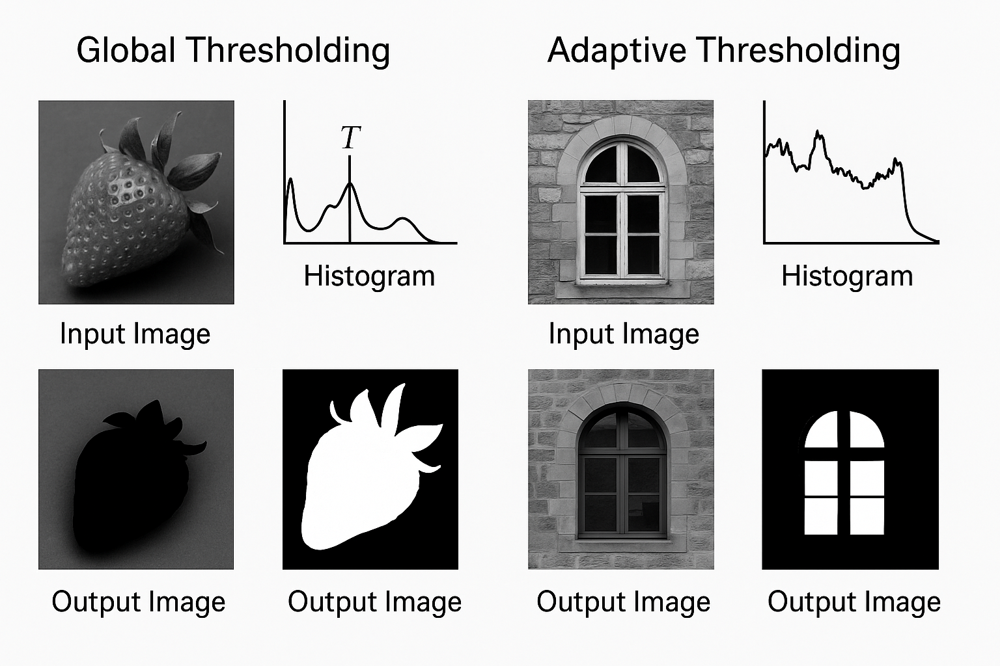


---

## 🔵 5. Region-Oriented Segmentation

---

### 🧠 **Core Idea:**

Start from one or more **seed pixels**, and **grow a region** by including neighboring pixels that share similar characteristics (e.g., color, intensity, texture).

This method focuses on **homogeneity** within regions and **discontinuity** between them.

---

### 🔧 **Typical Algorithm: Region Growing**

#### ✔ Steps:

1. **Seed Selection**: Choose initial pixel(s) manually or automatically.
2. **Similarity Check**: Compare each neighboring pixel to the region.
3. **Region Expansion**: If the pixel is similar (e.g., intensity difference below a threshold), include it.
4. **Repeat** until no more similar neighbors can be added.

---

### 📏 **Similarity Criteria**:

* **Intensity difference**: e.g., $|f(x,y) - \text{mean of region}| < T$
* **Color difference**
* **Texture measures**

---

### 📍 Example:

* In a grayscale medical image of the liver:

  * Start from a pixel inside the liver.
  * Grow outward to include all pixels with similar gray levels.
  * Stop at edges where the intensity changes sharply (i.e., the boundary of the liver).

---

### 🔎 Variants:

| Method               | Description                                                                   |
| -------------------- | ----------------------------------------------------------------------------- |
| **Region Splitting** | Start with the whole image and recursively divide it if it's not homogeneous  |
| **Region Merging**   | Start with many small regions and merge adjacent ones with similar properties |
| **Split-and-Merge**  | Combine both processes dynamically                                            |

---

### ✅ Pros and ❌ Cons:

| ✅ Pros                           | ❌ Cons                                     |
| -------------------------------- | ------------------------------------------ |
| Respects image structure         | Sensitive to noise and seed choice         |
| Good for smooth, uniform regions | May merge or miss subtle boundaries        |
| Simple to implement              | Computationally expensive for large images |

---

### 🧬 Ideal Use Cases:

* **Medical imaging** (e.g., liver, tumors)
* **Agricultural field detection** (satellite imagery)
* **Object segmentation** where texture and intensity are consistent

---



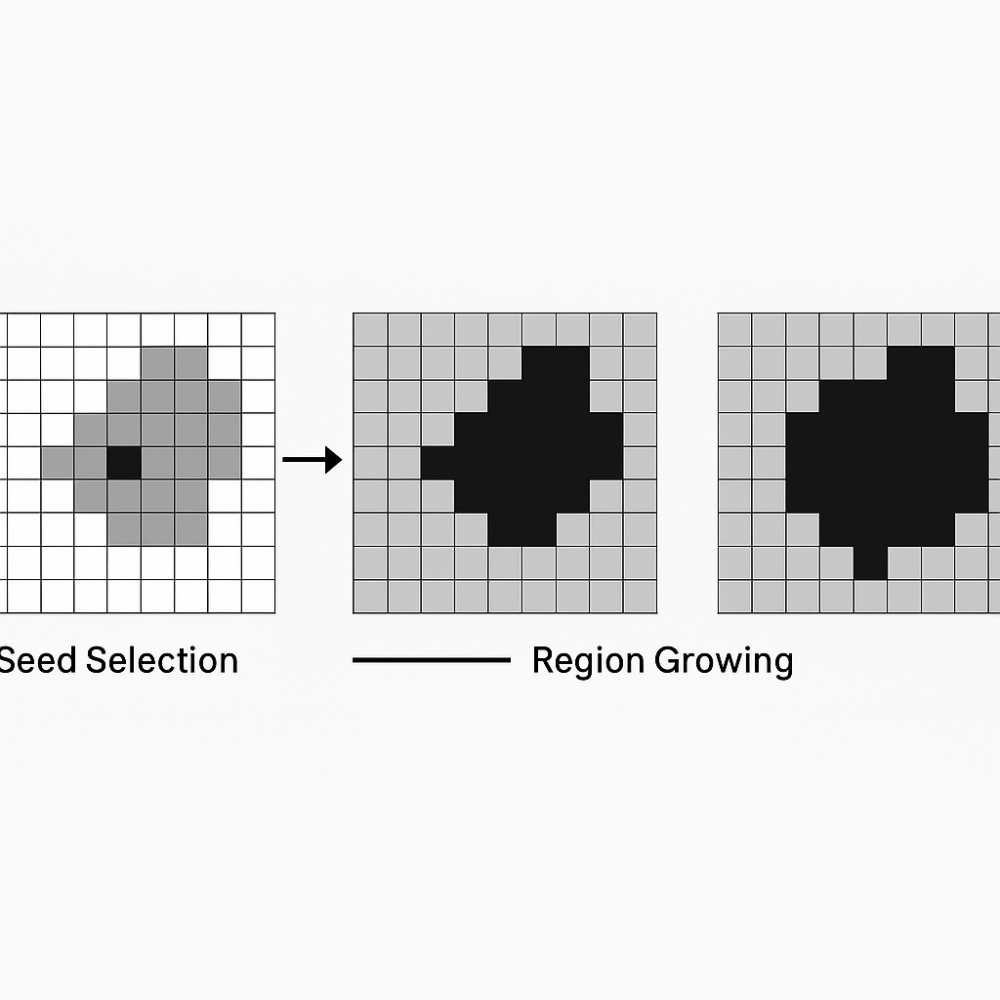


---

## 🔵 6. Watershed Segmentation

---

### 🧠 **Core Concept:**

Imagine the grayscale image as a **topographic surface**:

* **Bright areas = peaks**
* **Dark areas = valleys**

If you “flood” this landscape with water, the **watershed lines** are the **boundaries** where water from different catchment basins would meet.

---

### ⛏️ **Terminology:**

| Term                 | Meaning                                                                 |
| -------------------- | ----------------------------------------------------------------------- |
| **Catchment Basin**  | Region where water would collect and drain into a single local minimum  |
| **Watershed Line**   | Ridge that separates neighboring catchment basins                       |
| **Regional Minimum** | A group of connected pixels with the lowest intensity in a neighborhood |

---

## 🔄 Step-by-Step Process

1. **Visualize** the grayscale image as a 3D topography.
2. **Identify all regional minima** — lowest-intensity areas.
3. **Punch holes** in each minimum.
4. **Flood** the image from the minima. Water rises simultaneously in all basins.
5. **Build dams** when water from two basins is about to merge.
6. These **dams become the segmentation boundaries** (watershed lines).

---

### 🧭 **Key Insight:**

* The algorithm **segments regions** by tracking how intensity “flows” across the surface.
* Works best when applied to a **gradient image** (i.e. edges appear as high intensities).

---

## 📉 Example Use Case:

Segment overlapping **cells or coins** in microscopy or photography.

---

### 🧰 Practical Implementation Tips:

* Apply **gradient filter** (e.g. Sobel) to enhance edges before applying watershed.
* Use **markers** (internal & external) to guide the algorithm and reduce **over-segmentation**.

---

## ✅ Pros and ❌ Cons

| ✅ Advantages                   | ❌ Disadvantages                               |
| ------------------------------ | --------------------------------------------- |
| Clear, accurate boundaries     | **Over-segmentation** in noisy images         |
| Intuitive and well-established | Sensitive to small variations                 |
| Can separate touching objects  | May require preprocessing (gradient, markers) |

---

### 🔁 Marker-Controlled Watershed

Improves performance by **manually or automatically defining markers**:

* **Foreground markers** (inside the object)
* **Background markers** (outside the object)
* Flooding starts only from marker-defined areas

This helps **prevent over-segmentation** and improves boundary accuracy.

---



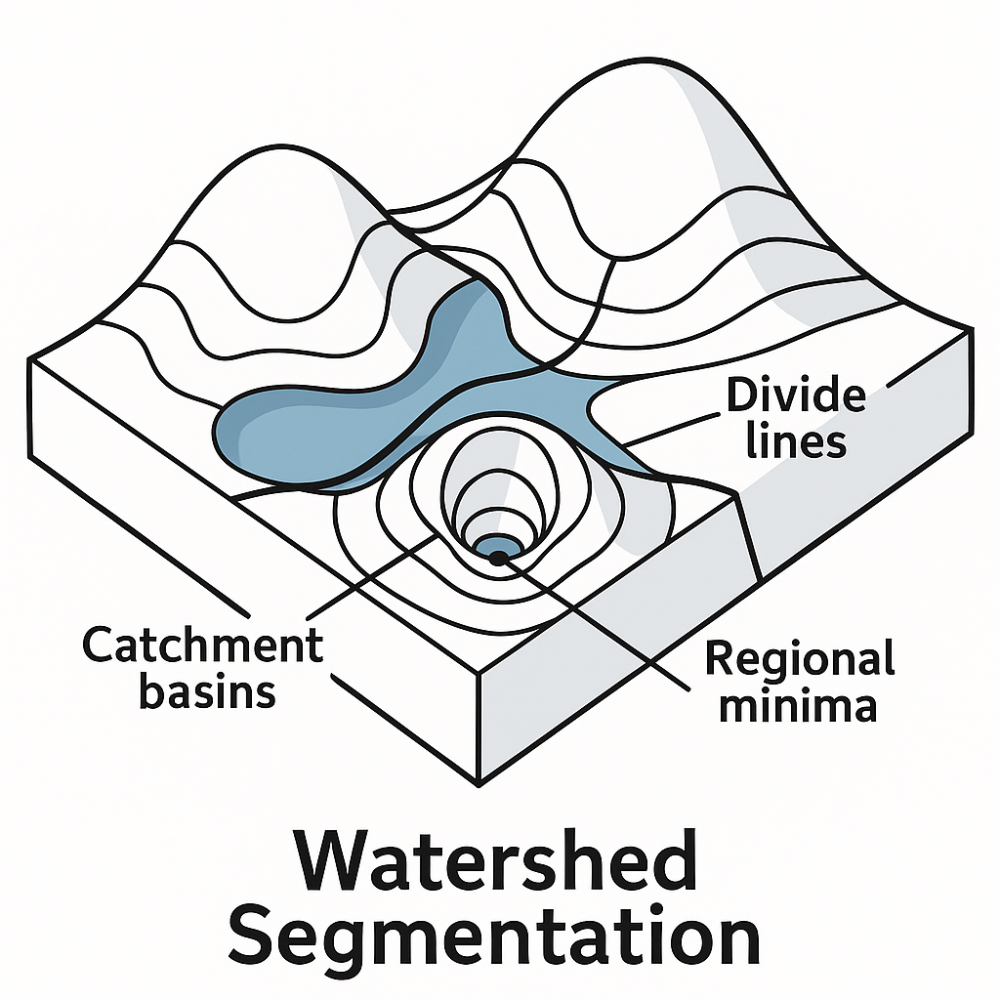


---

## 🔵 7. Deep Learning-Based Methods

---

### 🧠 **What Makes Deep Learning Different?**

Unlike traditional methods (e.g. thresholding or watershed), deep learning learns **features and segmentation rules directly from labeled data** using **neural networks**.

It answers:

> “Given this input image, what class label should each pixel have?”

---

## 🔷 A. Encoder-Decoder Architectures

---

### ✔ Overview:

These architectures consist of two symmetrical components:

| Component   | Role                                                                                              |
| ----------- | ------------------------------------------------------------------------------------------------- |
| **Encoder** | Downsamples the image to extract deep semantic features (context)                                 |
| **Decoder** | Upsamples the feature map back to the original resolution to generate a **dense prediction mask** |

---

### ✔ Building Blocks:

| Part                 | Techniques                                                                |
| -------------------- | ------------------------------------------------------------------------- |
| **Encoder**          | Convolutions, ReLU, Pooling                                               |
| **Decoder**          | Upsampling, Transposed Convolutions, Unpooling                            |
| **Skip Connections** | Combine encoder features with decoder features to **retain fine details** |

---

### 🧱 Common Architectures:

* **FCN (Fully Convolutional Networks)**
* **SegNet**
* **U-Net**
* **DeepLabv3+**
* **Mask R-CNN** (for instance segmentation)

---

## 🔷 B. What Is Deconvolution?

Also called **Transposed Convolution** or **Upconvolution**, it's used to **increase the spatial resolution** of feature maps.

* Think of it as the opposite of convolution.
* Crucial in the **decoder** to reconstruct pixel-level labels.

---

### 🔁 Skip Connections

* Combine early-layer features (high-resolution, low-semantic) with late-layer features (low-resolution, high-semantic).
* **U-Net** makes heavy use of this concept to preserve localization.

---

## 🔶 C. Case Study: **U-Net**

---

### 🧪 Summary:

**U-Net** (Ronneberger et al., 2015) is a **fully convolutional network** designed for **biomedical image segmentation**.

---

### 🧬 Architecture:

* **U-shape**: Symmetric encoder-decoder with skip connections.
* **Few Training Images**? Solved using **data augmentation** (elastic deformations).
* Works well even with **touching, overlapping structures**.

---

### 🧠 U-Net Highlights:

| Feature                | Benefit                             |
| ---------------------- | ----------------------------------- |
| Skip Connections       | Combine localization with context   |
| Small Dataset Friendly | Uses strong data augmentation       |
| End-to-End Trainable   | No hand-crafted features needed     |
| Fast Inference         | Suitable for real-time segmentation |

---

### 🏥 Example Applications:

* Tumor and organ segmentation
* Microscopy cell detection
* Retinal vessel analysis

---

## ✅ Advantages of Deep Learning Methods

| Strength        | Description                                        |
| --------------- | -------------------------------------------------- |
| **Accuracy**    | Outperforms classical methods on complex data      |
| **Flexibility** | Works on RGB, grayscale, medical, satellite images |
| **Scalability** | Learns features at multiple levels automatically   |
| **End-to-End**  | From raw pixels to segmentation map in one shot    |

---

## ❌ Limitations

| Weakness               | Description                                                                   |
| ---------------------- | ----------------------------------------------------------------------------- |
| **Data Requirement**   | Needs lots of annotated images (unless few-shot or transfer learning is used) |
| **Computational Cost** | Training is expensive (GPUs needed)                                           |
| **Interpretability**   | Harder to explain decisions than classical rules                              |

---



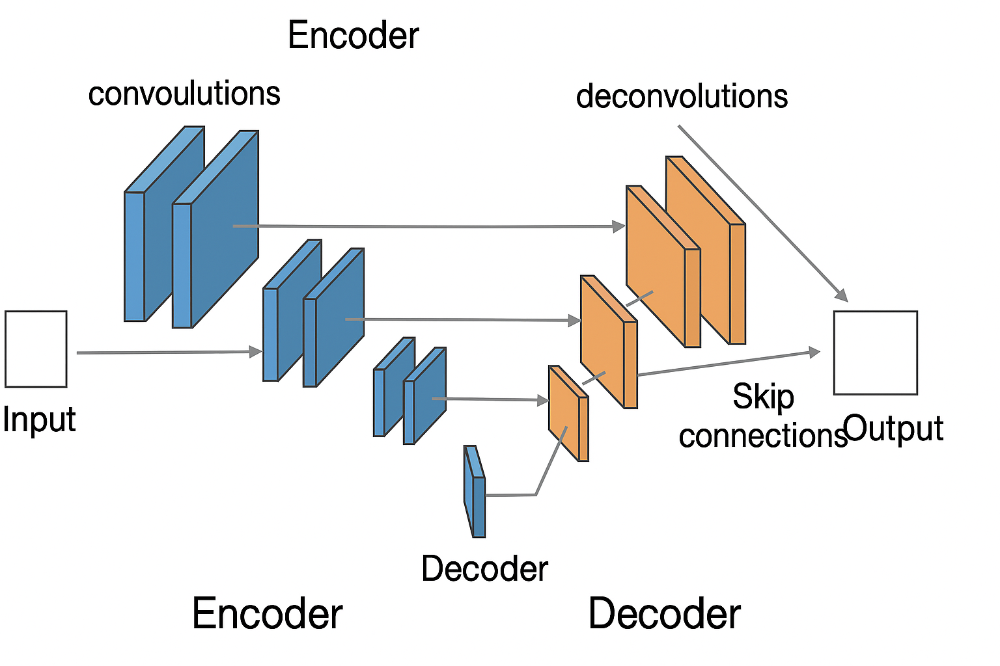


---

## 🔵 8. U-Net (Ronneberger et al., 2015)

---

### 📘 Paper Title:

**"U-Net: Convolutional Networks for Biomedical Image Segmentation"**
**Authors**: Olaf Ronneberger, Philipp Fischer, Thomas Brox
**Published at**: MICCAI 2015
**DOI**: [10.1007/978-3-319-24574-4\_28](https://doi.org/10.1007/978-3-319-24574-4_28)

---

## 🧠 Motivation

* Medical imaging often has **very few labeled images** due to the high cost of expert annotation.
* Traditional CNNs lose spatial information through pooling.
* U-Net was proposed to:

  * Work with **limited data**
  * **Preserve spatial details** during segmentation
  * Allow **end-to-end training**

---

## 🏗️ Architecture Overview

U-Net is a **fully convolutional encoder-decoder network** with **skip connections** between corresponding layers.

### 🧱 Components:

| Part                           | Description                                                                            |
| ------------------------------ | -------------------------------------------------------------------------------------- |
| **Encoder (Contracting Path)** | Repeated **2× Conv → ReLU → MaxPool** blocks to extract features and reduce resolution |
| **Decoder (Expanding Path)**   | **Upsampling + Conv** to restore resolution and make pixel-wise predictions            |
| **Skip Connections**           | Copy and concatenate encoder features to the decoder at matching resolution            |

> The result is a **U-shaped architecture**, hence the name **U-Net**.

---

### 🔍 Why Skip Connections Matter:

They bring **high-resolution spatial features** from the encoder directly into the decoder to help **accurately localize** structures.

---

## 🧪 Key Features

| Feature                 | Purpose                                                                          |
| ----------------------- | -------------------------------------------------------------------------------- |
| **Few training images** | Works well even with \~30 training examples                                      |
| **Data augmentation**   | Uses elastic deformations and other tricks to expand training data               |
| **Fast training**       | Achieves convergence quickly                                                     |
| **Robust**              | Handles **touching objects**, **intensity variations**, and **non-rigid shapes** |

---

## 🏥 Applications

Primarily used in **biomedical imaging**, but also generalized to other fields:

* Tumor detection (e.g., brain, breast, liver)
* Cell segmentation in microscopy
* Retinal vessel segmentation
* Lung boundary extraction in CT

---

## 📉 Training Tips

* Use **dice coefficient** or **IoU loss** (Intersection-over-Union) for imbalanced class segmentation.
* Apply **mirror padding** for border sensitivity.
* Use **patch-wise training** if images are too large to fit in memory.

---

## ✅ Strengths and ❌ Limitations

| ✅ Pros                                  | ❌ Cons                                       |
| --------------------------------------- | -------------------------------------------- |
| Works with very few annotated images    | U-Net can be large and heavy for mobile apps |
| Handles overlapping/touching structures | Struggles with ultra-large context           |
| Easy to implement and extend            | Sensitive to hyperparameters                 |

---

### 🎓 Variants of U-Net

* **3D U-Net**: For volumetric data (e.g., MRI slices)
* **Attention U-Net**: Uses attention gates to focus on important regions
* **ResUNet**: Combines U-Net with residual connections
* **UNet++**: Adds nested dense skip paths

---



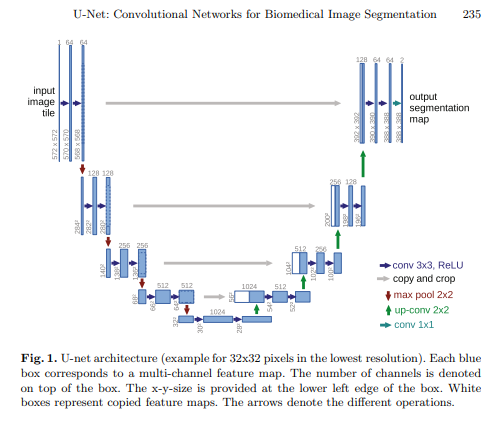

---

## 🟢 Summary Table

| Method                      | Type          | Strengths                       | Weaknesses                            |
| --------------------------- | ------------- | ------------------------------- | ------------------------------------- |
| **Thresholding**            | Pixel-based   | Fast, simple                    | Fails with uneven lighting            |
| **Adaptive Thresholding**   | Pixel-based   | Works with non-uniform lighting | Sensitive to noise                    |
| **Region Growing**          | Region-based  | Captures object shape           | Needs good seed selection             |
| **Watershed**               | Topographic   | Detects boundaries well         | Over-segmentation if not preprocessed |
| **Encoder-Decoder (U-Net)** | Deep learning | Very accurate, learns from data | Needs training data, GPU              |

---
